# Bishop’s University
## Department of Computer Science
### CS462-CS562 – Image Processing & Mathematical Modeling of Image
### Winter 2024 – HW2


### Notes: 
1. Please provide your answer within the designated cells in the notebook. Do not create new cells.
2. Ensure that you create the functions as specified. Failure to adhere to the requirements may result in a score of zero. Also, make sure to maintain the numbering of the questions as listed in the homework document.

In [1]:
# 1. load_image()
from PIL import Image
import numpy as np

def load_image(image_filename):
    input_image = Image.open(image_filename)

    # if Input Image is not Gray Image
    if not len(input_image.getbands()) == 1:
        input_image = input_image.convert('L') # Convert Input Image to Gray Scale
    
    # input image to image array
    image_array = np.array(input_image)
    
    # if input image scale is not in between 0.0 and 1.0
    if np.max(input_image) > 1.0: 
        image_array = image_array.astype(np.float32) / 255.0
    
    print(image_array.shape)
    print("Minimum intensity:", np.min(image_array))
    print("Maximum intensity:", np.max(image_array))

    return image_array

In [2]:
# 2. add Gnnoise() # to add Gaussian noise
def add_Gnoise(gray_image, std, mean=0):
    # Random Gaussian noise with same shape as input image
    noise = np.random.normal(mean, std, gray_image.shape)
    
    # Add the Gaussian noise with the input image
    noisy_image = gray_image + noise
    
    # Clip the values within the valid range [0, 255]
    # noisy_image = np.clip(noisy_image, 0, 255)
    
    # Clip the values within the valid range [0.0, 1.0]
    noisy_image = np.clip(noisy_image, 0.0, 1.0)

    return noisy_image

In [3]:
# 3. add_SPnoise() # to add SP noise
def add_SPnoise(input_image, salt_prob, pepper_prob):
    # Copy of actual image
    noisy_image = np.copy(input_image)
    
    # Generate random values for salt and pepper masks
    salt_mask = np.random.rand(*input_image.shape) < salt_prob
    pepper_mask = np.random.rand(*input_image.shape) < pepper_prob
    
    # Salt noise
    noisy_image[salt_mask] = 1.0
    
    # Pepper noise
    noisy_image[pepper_mask] = 0.0
    
    return noisy_image

In [4]:
# 4. filter_image()
import cv2

def filter_image(noisy_image, desired_filter):
    # again scaling the image to 0.0 - 1.0
    noisy_image = noisy_image.astype(np.float32) / 255.0
    
    if desired_filter == 'gaussian':
        # Gaussian filter with kernel size (3, 3) and Standard Deviation 0
        filtered_image = cv2.GaussianBlur(noisy_image, ksize = (3, 3), sigmaX=0)
    elif desired_filter == 'median':
        # Median filter with kernel size (3, 3)
        filtered_image = cv2.medianBlur(noisy_image, ksize = 5)
    elif desired_filter == 'bilateral':
        # Bilateral filter  with diameter 9, sigma_color 75, and sigma_space 75
        filtered_image = cv2.bilateralFilter(noisy_image, d = 9, sigmaColor = 75, sigmaSpace = 75)
    else:
        filtered_image = noisy_image

    return filtered_image

In [5]:
# 5. psnr()
def psnr(original_image, filtered_image):
    # Mean squared error (MSE)
    mse = np.mean((original_image - filtered_image) ** 2)
    
    # Maximum possible pixel value
    max_pixel_value = np.max(original_image)
    
    # PSNR value
    psnr_value = round(20 * np.log10(max_pixel_value / np.sqrt(mse)), 2)
    
    return psnr_value

In [6]:
# 6. laod_image()
Boat = "boat_image.jpg" # Boat
Mandrill = "WhatsApp Image 2024-02-19 at 16.17.14 (1).jpeg" # Mandrill
Lena = "WhatsApp Image 2024-02-19 at 16.17.14.jpeg" # Lena

lena_gray_image = load_image(Lena)
mandrill_gray_image = load_image(Mandrill)
boat_gray_image = load_image(Boat)

# print("Minimum intensity:", np.min(boat_gray_image))
# print("Maximum intensity:", np.max(boat_gray_image))

(512, 512)
Minimum intensity: 0.08235294
Maximum intensity: 0.95686275
(512, 512)
Minimum intensity: 0.0
Maximum intensity: 0.91764706
(556, 556)
Minimum intensity: 0.023529412
Maximum intensity: 0.9137255


In [7]:
# 7. add_Gnoise()  # add a noise

# for rnage 0-255
# lena_noisy_image_5 = add_Gnoise(lena_gray_image,std=5)
# lena_noisy_image_10 = add_Gnoise(lena_gray_image, std=10)
# lena_noisy_image_15 = add_Gnoise(lena_gray_image, std=15)
# lena_noisy_image_20 = add_Gnoise(lena_gray_image, std=20)

# mandrill_noisy_image_5 = add_Gnoise(mandrill_gray_image, std=5)
# mandrill_noisy_image_10 = add_Gnoise(mandrill_gray_image, std=10)
# mandrill_noisy_image_15 = add_Gnoise(mandrill_gray_image, std=15)
# mandrill_noisy_image_20 = add_Gnoise(mandrill_gray_image, std=20)

# boat_noisy_image_5 = add_Gnoise(boat_gray_image, std=5)
# boat_noisy_image_10 = add_Gnoise(boat_gray_image, std=10)
# boat_noisy_image_15 = add_Gnoise(boat_gray_image, std=15)
# boat_noisy_image_20 = add_Gnoise(boat_gray_image, std=20)

# for rnage 0.0-1.0
std_values = [5, 10, 15, 20]

# Gnoise values for each standard deviation
noise_values = [std / 255.0 for std in std_values]

lena_noisy_image_5 = add_Gnoise(lena_gray_image, std=noise_values[0]) 
lena_noisy_image_10 = add_Gnoise(lena_gray_image, std=noise_values[1])
lena_noisy_image_15 = add_Gnoise(lena_gray_image, std=noise_values[2])
lena_noisy_image_20 = add_Gnoise(lena_gray_image, std=noise_values[3])

mandrill_noisy_image_5 = add_Gnoise(mandrill_gray_image, std=noise_values[0])
mandrill_noisy_image_10 = add_Gnoise(mandrill_gray_image, std=noise_values[1])
mandrill_noisy_image_15 = add_Gnoise(mandrill_gray_image, std=noise_values[2])
mandrill_noisy_image_20 = add_Gnoise(mandrill_gray_image, std=noise_values[3])

boat_noisy_image_5 = add_Gnoise(boat_gray_image, std=noise_values[0])
boat_noisy_image_10 = add_Gnoise(boat_gray_image, std=noise_values[1])
boat_noisy_image_15 = add_Gnoise(boat_gray_image, std=noise_values[2])
boat_noisy_image_20 = add_Gnoise(boat_gray_image, std=noise_values[3])

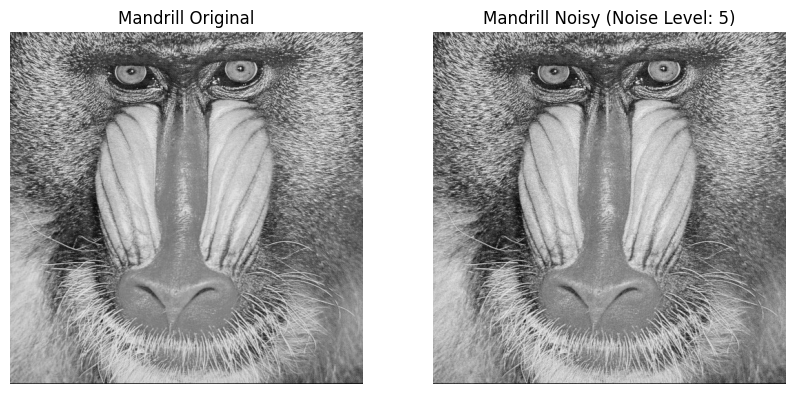

In [8]:
# 8. Display the original images and their corresponding noisy images. 
import matplotlib.pyplot as plt

def display_images(original_gray_image, noisy_image):
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_gray_image, cmap='gray')
    plt.title('Mandrill Original')
    plt.axis('off')
    
    # Noisy image
    plt.subplot(1, 2, 2)
    plt.imshow(noisy_image, cmap='gray')
    plt.title(f'Mandrill Noisy (Noise Level: 5)')
    plt.axis('off')
    
    plt.show()

display_images(mandrill_gray_image, mandrill_noisy_image_5)

In [9]:
# 9. filter_image() # to filter an image. Use the three filters.

# Lena
lena_filtered_image_5_gaussian = filter_image(lena_noisy_image_5,"gaussian")
lena_filtered_image_5_median = filter_image(lena_noisy_image_5,"median")
lena_filtered_image_5_bilateral = filter_image(lena_noisy_image_5,"bilateral")
lena_filtered_image_10_gaussian = filter_image(lena_noisy_image_10,"gaussian")
lena_filtered_image_10_median = filter_image(lena_noisy_image_10,"median")
lena_filtered_image_10_bilateral = filter_image(lena_noisy_image_10,"bilateral")
lena_filtered_image_15_gaussian = filter_image(lena_noisy_image_15,"gaussian")
lena_filtered_image_15_median = filter_image(lena_noisy_image_15,"median")
lena_filtered_image_15_bilateral = filter_image(lena_noisy_image_15,"bilateral")
lena_filtered_image_20_gaussian = filter_image(lena_noisy_image_20,"gaussian")
lena_filtered_image_20_median = filter_image(lena_noisy_image_20,"median")
lena_filtered_image_20_bilateral = filter_image(lena_noisy_image_20,"bilateral")

# Mandrill
mandrill_lena_filtered_image_5_gaussian = filter_image(mandrill_noisy_image_5,"gaussian")
mandrill_filtered_image_5_bilateral = filter_image(mandrill_noisy_image_5,"bilateral")
mandrill_filtered_image_5_median = filter_image(mandrill_noisy_image_5,"median")
mandrill_filtered_image_10_gaussian = filter_image(mandrill_noisy_image_10,"gaussian")
mandrill_filtered_image_10_median = filter_image(mandrill_noisy_image_10,"median")
mandrill_filtered_image_10_bilateral = filter_image(mandrill_noisy_image_10,"bilateral")
mandrill_filtered_image_15_gaussian = filter_image(mandrill_noisy_image_15,"gaussian")
mandrill_filtered_image_15_median = filter_image(mandrill_noisy_image_15,"median")
mandrill_filtered_image_15_bilateral = filter_image(mandrill_noisy_image_15,"bilateral")
mandrill_filtered_image_5_gaussian = filter_image(mandrill_noisy_image_5,"gaussian")
mandrill_filtered_image_20_gaussian = filter_image(mandrill_noisy_image_20,"gaussian")
mandrill_filtered_image_20_median = filter_image(mandrill_noisy_image_20,"median")
mandrill_filtered_image_20_bilateral = filter_image(mandrill_noisy_image_20,"bilateral")

# Boat
boat_filtered_image_5_gaussian = filter_image(boat_noisy_image_5,"gaussian")
boat_filtered_image_5_median = filter_image(boat_noisy_image_5,"median")
boat_filtered_image_5_bilateral = filter_image(boat_noisy_image_5,"bilateral")
boat_filtered_image_10_gaussian = filter_image(boat_noisy_image_10,"gaussian")
boat_filtered_image_10_median = filter_image(boat_noisy_image_10,"median")
boat_filtered_image_10_bilateral = filter_image(boat_noisy_image_10,"bilateral")
boat_filtered_image_15_gaussian = filter_image(boat_noisy_image_15,"gaussian")
boat_filtered_image_15_median = filter_image(boat_noisy_image_15,"median")
boat_filtered_image_15_bilateral = filter_image(boat_noisy_image_15,"bilateral")
boat_filtered_image_20_gaussian = filter_image(boat_noisy_image_20,"gaussian")
boat_filtered_image_20_median = filter_image(boat_noisy_image_20,"median")
boat_filtered_image_20_bilateral = filter_image(boat_noisy_image_20,"bilateral")

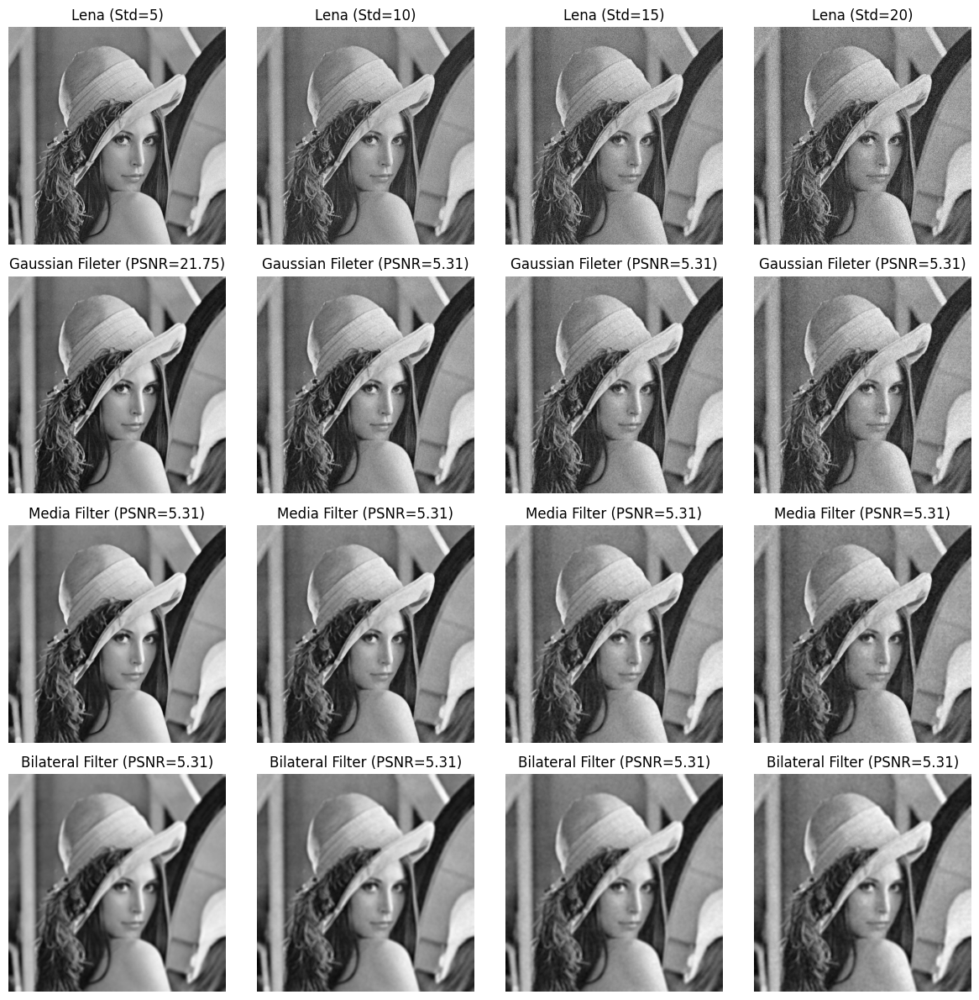

In [10]:
# 10.  Display the Boat noisy image with different levels of noise, and the filtered images

def plot_images(images, titles):

    plt.figure(figsize=(12,12))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(4, 4, i)
        plt.imshow(image, cmap='gray')
        plt.title(title)
        plt.axis('off')


def get_psnr_value(original_image, filtered_image):
    psnr_values = []
    psnr_values.append(psnr(original_image, filtered_image))
    return psnr_values


def get_titles(image_name, psnr_values):
    std_values = [5,10,15,20]
    filters = ["Gaussian Fileter", "Media Filter", "Bilateral Filter" ]
    titles = []

    titles.append("{} (Std={})".format(image_name,5))
    titles.append("{} (Std={})".format(image_name,10))
    titles.append("{} (Std={})".format(image_name,15))
    titles.append("{} (Std={})".format(image_name,20))
    for i in range(3):
        for j in range(4):
            # titles.append("{} {} (Std={}) (PSNR={})".format(image_name,filters[i],std_values[j],psnr_values.pop(0)))
            titles.append("{} (PSNR={})".format(filters[i],psnr_values.pop(0)))
        
    return titles


images = [lena_noisy_image_5,lena_noisy_image_10,lena_noisy_image_15,lena_noisy_image_20,\
          lena_filtered_image_5_gaussian,lena_filtered_image_10_gaussian,lena_filtered_image_15_gaussian,lena_filtered_image_20_gaussian,\
          lena_filtered_image_5_median,lena_filtered_image_10_median,lena_filtered_image_15_median,lena_filtered_image_20_median,\
          lena_filtered_image_5_bilateral,lena_filtered_image_10_bilateral,lena_filtered_image_15_bilateral,lena_filtered_image_20_bilateral]

psnr_values = []
for img in images[3:]:
    psnr_values.append(psnr(lena_gray_image, img))

titles = get_titles("Lena", psnr_values)

plot_images(images, titles)
plt.tight_layout()
plt.show()

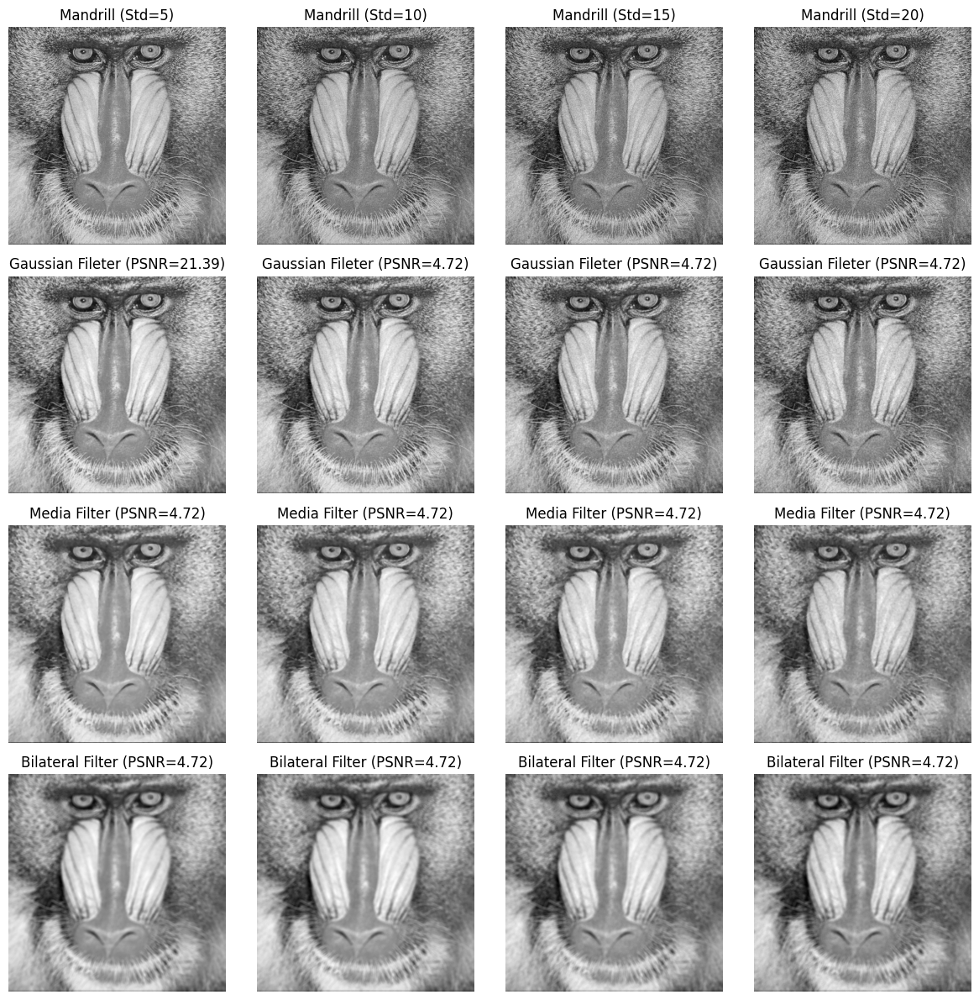

In [11]:
# 11.  a) Display Lena noisy image with different levels of noise, and the filtered images

images = [mandrill_noisy_image_5,mandrill_noisy_image_10,mandrill_noisy_image_15,mandrill_noisy_image_20,\
          mandrill_filtered_image_5_gaussian,mandrill_filtered_image_10_gaussian,mandrill_filtered_image_15_gaussian,mandrill_filtered_image_20_gaussian,\
          mandrill_filtered_image_5_median,mandrill_filtered_image_10_median,mandrill_filtered_image_15_median,mandrill_filtered_image_20_median,\
          mandrill_filtered_image_5_bilateral,mandrill_filtered_image_10_bilateral,mandrill_filtered_image_15_bilateral,mandrill_filtered_image_20_bilateral]

psnr_values = []
for img in images[3:]:
    psnr_values.append(psnr(mandrill_gray_image, img))

titles = get_titles("Mandrill", psnr_values)

plot_images(images, titles)
plt.tight_layout()
plt.show()

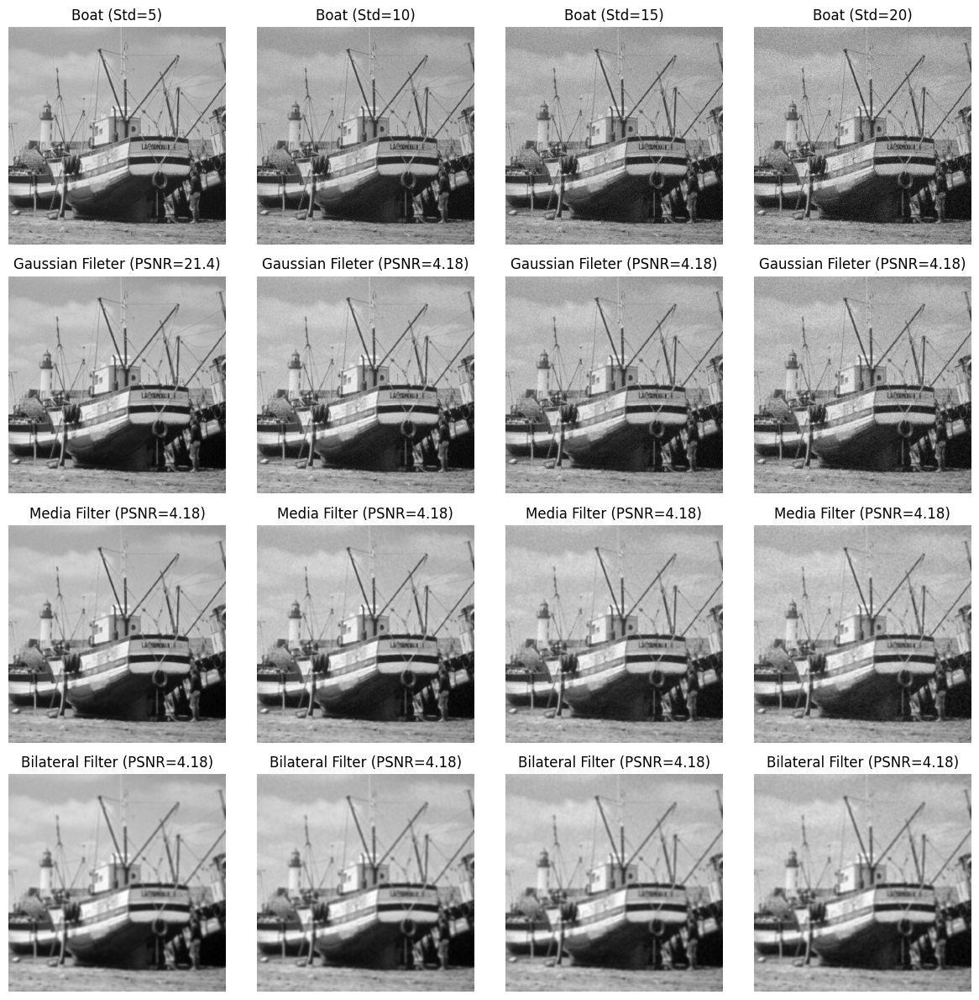

In [12]:
# 11.  b) Display Madrill noisy image with different levels of noise, and the filtered images
images = [boat_noisy_image_5,boat_noisy_image_10,boat_noisy_image_15,boat_noisy_image_20,\
          boat_filtered_image_5_gaussian,boat_filtered_image_10_gaussian,boat_filtered_image_15_gaussian,boat_filtered_image_20_gaussian,\
          boat_filtered_image_5_median,boat_filtered_image_10_median,boat_filtered_image_15_median,boat_filtered_image_20_median,\
          boat_filtered_image_5_bilateral,boat_filtered_image_10_bilateral,boat_filtered_image_15_bilateral,boat_filtered_image_20_bilateral]

psnr_values = []
for img in images[3:]:
    psnr_values.append(psnr(boat_gray_image, img))

titles = get_titles("Boat", psnr_values)

plot_images(images, titles)
plt.tight_layout()
plt.show()

In [13]:
# 12. add_SPnoise() # to add SP noise

std_values = [5, 10, 15, 20]
# Gnoise values for each standard deviation (0.0 - 1.0)
noise_values = [std / 255.0 for std in std_values]

lena_SPnoise_image_5 = add_SPnoise(lena_gray_image, salt_prob=noise_values[0], pepper_prob=noise_values[0])
lena_SPnoise_image_10 = add_SPnoise(lena_gray_image, salt_prob=noise_values[1], pepper_prob=noise_values[1])
lena_SPnoise_image_15 = add_SPnoise(lena_gray_image, salt_prob=noise_values[2], pepper_prob=noise_values[2])
lena_SPnoise_image_20 = add_SPnoise(lena_gray_image, salt_prob=noise_values[3], pepper_prob=noise_values[3])

mandrill_SPnoise_image_5 = add_SPnoise(mandrill_gray_image, salt_prob=noise_values[0], pepper_prob=noise_values[0])
mandrill_SPnoise_image_10 = add_SPnoise(mandrill_gray_image, salt_prob=noise_values[1], pepper_prob=noise_values[1])
mandrill_SPnoise_image_15 = add_SPnoise(mandrill_gray_image, salt_prob=noise_values[2], pepper_prob=noise_values[2])
mandrill_SPnoise_image_20 = add_SPnoise(mandrill_gray_image, salt_prob=noise_values[3], pepper_prob=noise_values[3])

boat_SPnoise_image_5 = add_SPnoise(boat_gray_image, salt_prob=noise_values[0], pepper_prob=noise_values[0])
boat_SPnoise_image_10 = add_SPnoise(boat_gray_image, salt_prob=noise_values[1], pepper_prob=noise_values[1])
boat_SPnoise_image_15 = add_SPnoise(boat_gray_image, salt_prob=noise_values[2], pepper_prob=noise_values[2])
boat_SPnoise_image_20 = add_SPnoise(boat_gray_image, salt_prob=noise_values[3], pepper_prob=noise_values[3])

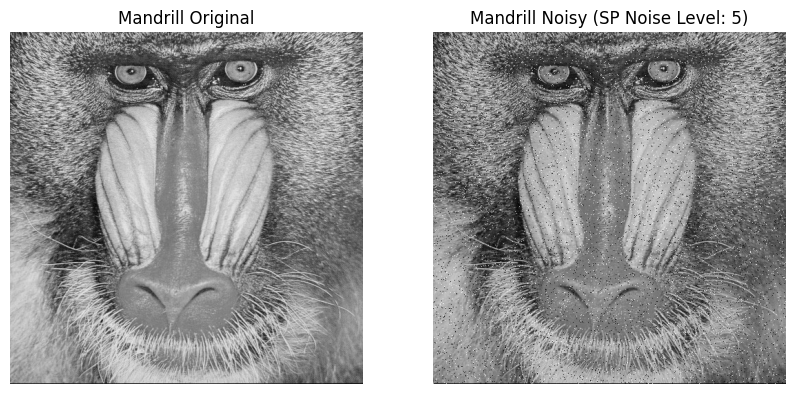

In [14]:
# 13. a) Display the original images and their corresponding noisy images. 
def display_images(original_gray_image, noisy_image):
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_gray_image, cmap='gray')
    plt.title('Mandrill Original')
    plt.axis('off')
    
    # Noisy image
    plt.subplot(1, 2, 2)
    plt.imshow(noisy_image, cmap='gray')
    plt.title(f'Mandrill Noisy (SP Noise Level: 5)')
    plt.axis('off')
    
    plt.show()

display_images(mandrill_gray_image, mandrill_SPnoise_image_5)

In [15]:
# 13. b)  filter_image() # to filter an image. Use the three filters.

# Lena
lena_SPfiltered_image_5_gaussian = filter_image(lena_SPnoise_image_5,"gaussian")
lena_SPfiltered_image_5_median = filter_image(lena_SPnoise_image_5,"median")
lena_SPfiltered_image_5_bilateral = filter_image(lena_SPnoise_image_5,"bilateral")
lena_SPfiltered_image_10_gaussian = filter_image(lena_SPnoise_image_10,"gaussian")
lena_SPfiltered_image_10_median = filter_image(lena_SPnoise_image_10,"median")
lena_SPfiltered_image_10_bilateral = filter_image(lena_SPnoise_image_10,"bilateral")
lena_SPfiltered_image_15_gaussian = filter_image(lena_SPnoise_image_15,"gaussian")
lena_SPfiltered_image_15_median = filter_image(lena_SPnoise_image_15,"median")
lena_SPfiltered_image_15_bilateral = filter_image(lena_SPnoise_image_15,"bilateral")
lena_SPfiltered_image_20_gaussian = filter_image(lena_SPnoise_image_20,"gaussian")
lena_SPfiltered_image_20_median = filter_image(lena_SPnoise_image_20,"median")
lena_SPfiltered_image_20_bilateral = filter_image(lena_SPnoise_image_20,"bilateral")

# Mandrill
mandrill_lena_SPfiltered_image_5_gaussian = filter_image(mandrill_SPnoise_image_5,"gaussian")
mandrill_SPfiltered_image_5_bilateral = filter_image(mandrill_SPnoise_image_5,"bilateral")
mandrill_SPfiltered_image_5_median = filter_image(mandrill_SPnoise_image_5,"median")
mandrill_SPfiltered_image_10_gaussian = filter_image(mandrill_SPnoise_image_10,"gaussian")
mandrill_SPfiltered_image_10_median = filter_image(mandrill_SPnoise_image_10,"median")
mandrill_SPfiltered_image_10_bilateral = filter_image(mandrill_SPnoise_image_10,"bilateral")
mandrill_SPfiltered_image_15_gaussian = filter_image(mandrill_SPnoise_image_15,"gaussian")
mandrill_SPfiltered_image_15_median = filter_image(mandrill_SPnoise_image_15,"median")
mandrill_SPfiltered_image_15_bilateral = filter_image(mandrill_SPnoise_image_15,"bilateral")
mandrill_SPfiltered_image_5_gaussian = filter_image(mandrill_SPnoise_image_5,"gaussian")
mandrill_SPfiltered_image_20_gaussian = filter_image(mandrill_SPnoise_image_20,"gaussian")
mandrill_SPfiltered_image_20_median = filter_image(mandrill_SPnoise_image_20,"median")
mandrill_SPfiltered_image_20_bilateral = filter_image(mandrill_SPnoise_image_20,"bilateral")

# Boat
boat_SPfiltered_image_5_gaussian = filter_image(boat_SPnoise_image_5,"gaussian")
boat_SPfiltered_image_5_median = filter_image(boat_SPnoise_image_5,"median")
boat_SPfiltered_image_5_bilateral = filter_image(boat_SPnoise_image_5,"bilateral")
boat_SPfiltered_image_10_gaussian = filter_image(boat_SPnoise_image_10,"gaussian")
boat_SPfiltered_image_10_median = filter_image(boat_SPnoise_image_10,"median")
boat_SPfiltered_image_10_bilateral = filter_image(boat_SPnoise_image_10,"bilateral")
boat_SPfiltered_image_15_gaussian = filter_image(boat_SPnoise_image_15,"gaussian")
boat_SPfiltered_image_15_median = filter_image(boat_SPnoise_image_15,"median")
boat_SPfiltered_image_15_bilateral = filter_image(boat_SPnoise_image_15,"bilateral")
boat_SPfiltered_image_20_gaussian = filter_image(boat_SPnoise_image_20,"gaussian")
boat_SPfiltered_image_20_median = filter_image(boat_SPnoise_image_20,"median")
boat_SPfiltered_image_20_bilateral = filter_image(boat_SPnoise_image_20,"bilateral")

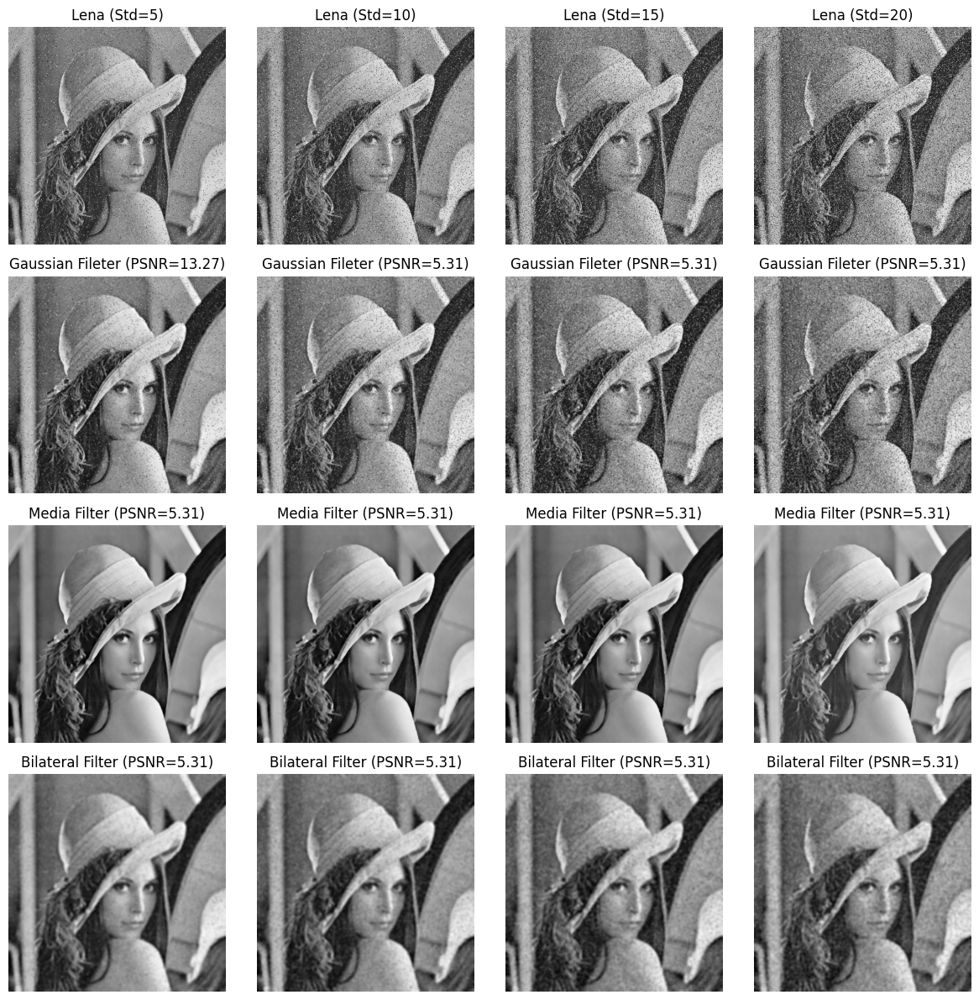

In [16]:
# 13. c) Display the Boat noisy image with different levels of noise, and the filtered images

images = [lena_SPnoise_image_5,lena_SPnoise_image_10,lena_SPnoise_image_15,lena_SPnoise_image_20,\
          lena_SPfiltered_image_5_gaussian,lena_SPfiltered_image_10_gaussian,lena_SPfiltered_image_15_gaussian,lena_SPfiltered_image_20_gaussian,\
          lena_SPfiltered_image_5_median,lena_SPfiltered_image_10_median,lena_SPfiltered_image_15_median,lena_SPfiltered_image_20_median,\
          lena_SPfiltered_image_5_bilateral,lena_SPfiltered_image_10_bilateral,lena_SPfiltered_image_15_bilateral,lena_SPfiltered_image_20_bilateral]

psnr_values = []
for img in images[3:]:
    psnr_values.append(psnr(lena_gray_image, img))

titles = get_titles("Lena", psnr_values)

plot_images(images, titles)
plt.tight_layout()
plt.show()

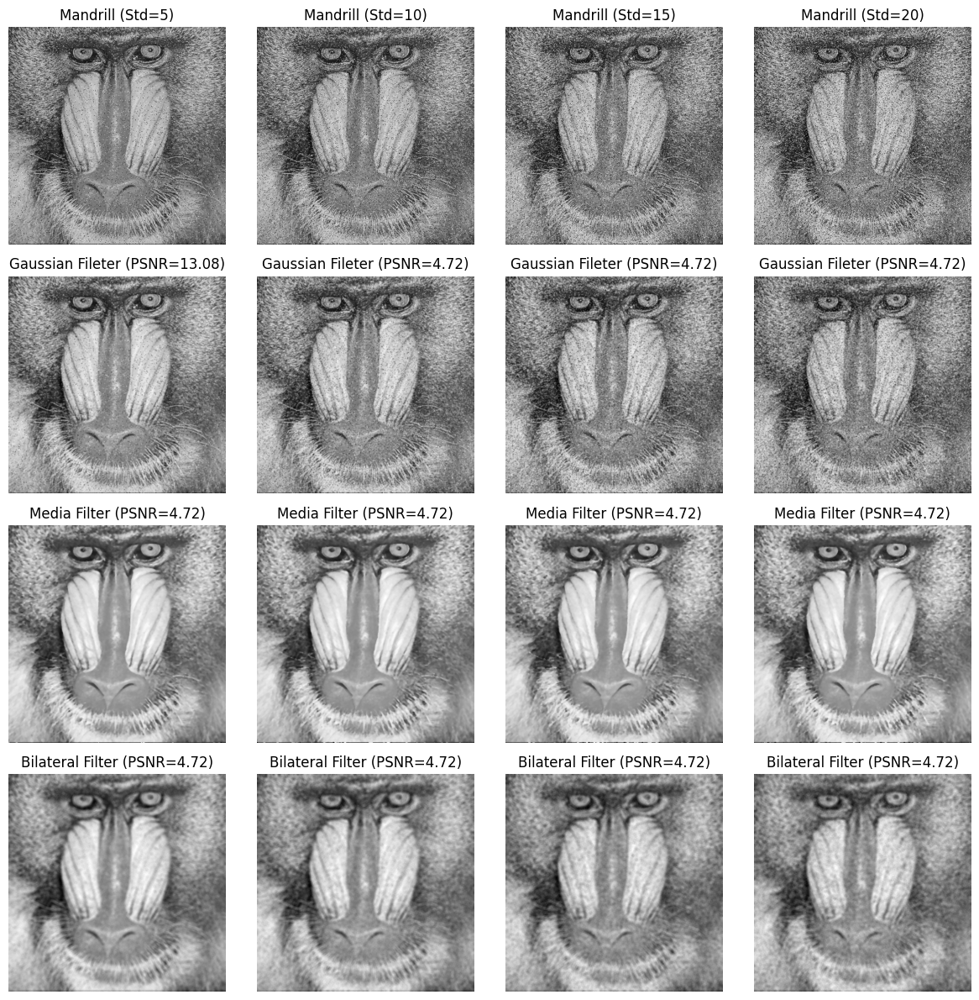

In [17]:
# 13. d) Display Lena noisy image with different levels of noise, and the filtered images
images = [mandrill_SPnoise_image_5,mandrill_SPnoise_image_10,mandrill_SPnoise_image_15,mandrill_SPnoise_image_20,\
          mandrill_SPfiltered_image_5_gaussian,mandrill_SPfiltered_image_10_gaussian,mandrill_SPfiltered_image_15_gaussian,mandrill_SPfiltered_image_20_gaussian,\
          mandrill_SPfiltered_image_5_median,mandrill_SPfiltered_image_10_median,mandrill_SPfiltered_image_15_median,mandrill_SPfiltered_image_20_median,\
          mandrill_SPfiltered_image_5_bilateral,mandrill_SPfiltered_image_10_bilateral,mandrill_SPfiltered_image_15_bilateral,mandrill_SPfiltered_image_20_bilateral]

psnr_values = []
for img in images[3:]:
    psnr_values.append(psnr(mandrill_gray_image, img))

titles = get_titles("Mandrill", psnr_values)

plot_images(images, titles)
plt.tight_layout()
plt.show()

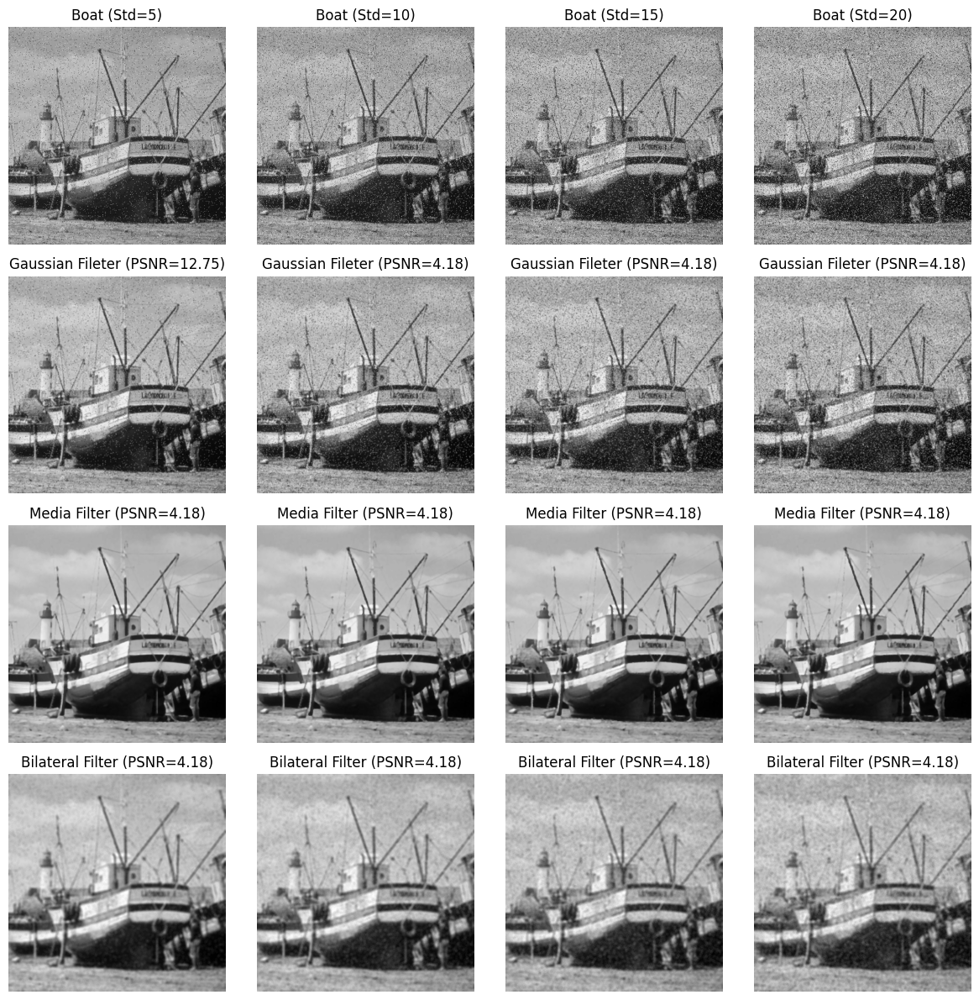

In [18]:
# 13. e) Display Madrill noisy image with different levels of noise, and the filtered images
images = [boat_SPnoise_image_5,boat_SPnoise_image_10,boat_SPnoise_image_15,boat_SPnoise_image_20,\
          boat_SPfiltered_image_5_gaussian,boat_SPfiltered_image_10_gaussian,boat_SPfiltered_image_15_gaussian,boat_SPfiltered_image_20_gaussian,\
          boat_SPfiltered_image_5_median,boat_SPfiltered_image_10_median,boat_SPfiltered_image_15_median,boat_SPfiltered_image_20_median,\
          boat_SPfiltered_image_5_bilateral,boat_SPfiltered_image_10_bilateral,boat_SPfiltered_image_15_bilateral,boat_SPfiltered_image_20_bilateral]

psnr_values = []
for img in images[3:]:
    psnr_values.append(psnr(boat_gray_image, img))

titles = get_titles("Boat", psnr_values)

plot_images(images, titles)
plt.tight_layout()
plt.show()

In [19]:
# 14. smooth_image() # to smooth Mandrill image

def smooth_image(original_image, kernel_size):
    # Gaussian filter
    smoothed_image = cv2.GaussianBlur(original_image, (kernel_size, kernel_size), 0)
    
    return smoothed_image

In [20]:
# 15. Laplace_sharpening() # to sharpen the image

def laplace_sharpening(smoothed_image, kernel_size):

    laplacian = cv2.Laplacian(smoothed_image, cv2.CV_32F, ksize=kernel_size)
    sharpened_image = smoothed_image + laplacian

    # Clip values to ensure they remain within the range [0.0, 1.0]
    sharpened_image = np.clip(sharpened_image, 0.0, 1.0)
    
    return sharpened_image 

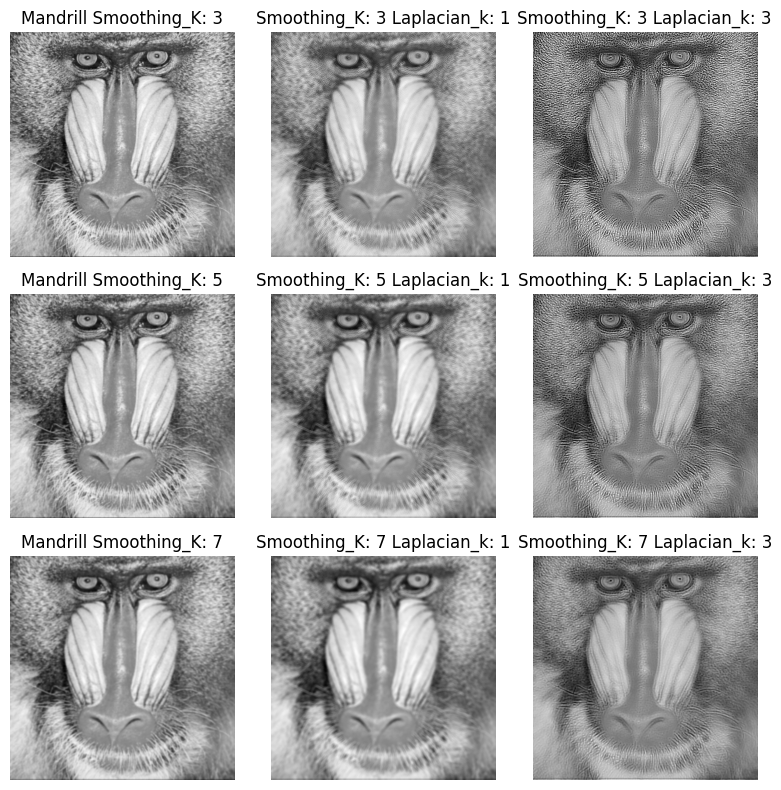

In [21]:
# 16. Present various smoothed and sharpened images, showcasing different parameter values.

import matplotlib.pyplot as plt
def plot_images(images, titles):
    plt.figure(figsize=(8,8))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(3, 3, i)
        plt.imshow(image, cmap='gray')
        plt.title(title)
        plt.axis('off')


def get_titles():
    kernel_values = [3,5,7]
    laplacian_kernel = [1,3]

    titles = []
    for i in range(3):
        titles.append("Mandrill Smoothing_K: {}".format(kernel_values[i]))
        for j in range(2):
            titles.append("Smoothing_K: {} Laplacian_k: {}".format(kernel_values[i],laplacian_kernel[j]))
        
    return titles

mandrill_smoothed_image_k3 = smooth_image(mandrill_gray_image, kernel_size=3)
mandrill_smoothed_image_k5 = smooth_image(mandrill_gray_image, kernel_size=5)
mandrill_smoothed_image_k7 = smooth_image(mandrill_gray_image, kernel_size=7)

mandrill_sharpened_image_k3k1 = laplace_sharpening(mandrill_smoothed_image_k3, kernel_size=1)
mandrill_sharpened_image_k3k3 = laplace_sharpening(mandrill_smoothed_image_k3, kernel_size=3)

mandrill_sharpened_image_k5k1 = laplace_sharpening(mandrill_smoothed_image_k5, kernel_size=1)
mandrill_sharpened_image_k5k3 = laplace_sharpening(mandrill_smoothed_image_k5, kernel_size=3)

mandrill_sharpened_image_k7k1 = laplace_sharpening(mandrill_smoothed_image_k7, kernel_size=1)
mandrill_sharpened_image_k7k3 = laplace_sharpening(mandrill_smoothed_image_k7, kernel_size=3)


images = [mandrill_smoothed_image_k3, mandrill_sharpened_image_k3k1, mandrill_sharpened_image_k3k3,\
          mandrill_smoothed_image_k5, mandrill_sharpened_image_k5k1, mandrill_sharpened_image_k5k3,\
          mandrill_smoothed_image_k7, mandrill_sharpened_image_k7k1, mandrill_sharpened_image_k7k3]

titles = get_titles()

plot_images(images, titles)
plt.tight_layout()
plt.show()